In [126]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import cv2
from sklearn.preprocessing import StandardScaler
import scipy.io as io
from random import uniform
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import KMeans, SpectralClustering
import random
from sklearn.metrics.cluster import contingency_matrix
from scipy.interpolate import interp1d
from sklearn.metrics import f1_score
from skimage import io, segmentation, color, graph
# import skimage.graph
from sklearn.neighbors import NearestNeighbors

# Reading the Dataset and Understanding its Format

The dataset is divided into two sectors: Images and Ground Truthes.
The images are of rgb layered format and each image has variable number of ground truthes mat files which differ according to the number of clusters in this file.
We read the images and ground truthes corresponding to 50 images.

This code loads images and ground truth data from a given directory path. It assumes that the images and ground truths are stored in separate directories, respectively.

The images are stored in the data['imgs'] array, and the ground truth data is stored in the data['gt'] list. Each entry in the data['gt'] list corresponds to an image and contains a list of ground truth data.

The code iterates over each image file and its corresponding ground truth file. For each image, it converts the color from BGR to RGB (since most image processing libraries work with RGB colors), resizes the image if necessary, and appends it to the data['imgs'] array.

For each ground truth file, it reads the file using io.loadmat(), extracts the ground truth data (which is a list of numpy arrays), and appends this list to the data['gt'] list.

In the end, the data dictionary contains two arrays (data['imgs'] and data['gt']) that store the images and their corresponding ground truth data, respectively.

The pathImages and pathGround variables are used to store the paths of the image and ground truth directories, respectively.

Please note that the code provided does not implement any image segmentation or recognition algorithm. It only loads the images and their corresponding ground truth data.

In [10]:
pathImages = 'E:/Term 07/Pattern Recognition/Projects/Project 02/image segmentation project/image segmentation project/Dataset/images/test'
pathGround = 'E:/Term 07/Pattern Recognition/Projects/Project 02/image segmentation project/image segmentation project/Dataset/ground_truth/test'
# results_path = base + "/results"
data = {}
# Load images
data['imgs'] = np.empty((0, 321, 481, 3), int)
data['file_name'] = np.empty(100)
for dirname, _, filenames in os.walk(img_path):
    filenames.sort()
    for filename in filenames:
        dataset['file_name'] = filename
        temp = os.path.join(dirname, filename)
        img_tmp = cv2.imread(temp)
        if filename == 'Thumbs.db':
            continue
        img_rgb = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2RGB)
        if img_rgb.shape[0] != 321:
            img_rgb = cv2.rotate(img_rgb, cv2.ROTATE_90_CLOCKWISE)
        img_rgb = np.array(img_rgb)
        data['imgs'] = np.append(data['imgs'], np.expand_dims(img_rgb, 0), axis=0)

# Load ground truths         
data['gt'] = []
for dirname, _, filenames in os.walk(gt_path):
    filenames.sort()
    for filename in filenames:
        temp = os.path.join(dirname, filename)
        file = io.loadmat(temp)
        map_list = []
        second_dim = file['groundTruth'].shape[1]        
        for i in range(second_dim):
            mapp = file['groundTruth'][0][i][0][0][0]
            map_list.append(mapp)
        data['gt'].append(map_list)

In [36]:
images = data['imgs'][50:100]
len(images)

50

In [117]:
grounds = data['gt'][50:100]
len(grounds)

50

# Visualization

Ploting and showing a random image and its possible ground truths






This code visualizes an image and its corresponding ground truth data.

First, it randomly selects an image and its ground truth data from the images and grounds arrays, respectively.

Next, it creates a plot with two subplots. Each subplot is a grid of h//2 cells, where h is the number of ground truth data entries for the selected image.

The code then iterates over the two subplots and their corresponding cells. For each cell, it visualizes the image or a ground truth data entry using the imshow() function from the matplotlib.pyplot library.

For example, if the image has two ground truth data entries, the code will visualize the image in the top-left cell of the first subplot and the first ground truth data entry in the top-right cell of the first subplot. It will then visualize the second ground truth data entry in the top-left cell of the second subplot.

Finally, the code displays the plot using the plt.show() function from the matplotlib.pyplot library.

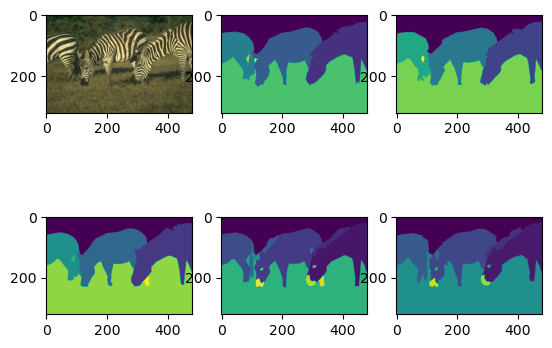

In [118]:
n = random.randint(0,50)
h = len(grounds[n])
fig, axes = plt.subplots(2, h//2)
image = images[n]
for i in range(2):
    for j in range(h//2):
        if(i == j and i == 0):
            axes[i, j].imshow(image)
        elif(i == 1):
            axes[i, j].imshow(grounds[n][(h//2)+j])
        else:
            axes[i, j].imshow(grounds[n][j])
plt.show()

# K Means Clustering

These images are clustered each for 5 times. In each time, the number of clusters is one of the following values: (3, 5, 7, 9, and 11).






This code clusters an image using the K-means algorithm. It stores the results of each clustering operation in a dictionary called clustered.

First, it initializes a dictionary called clustered and assigns it empty lists for each K value in the Ks list.

Next, it iterates over each K value in the Ks list. For each K value, it performs the following steps:

It iterates over each image in the images array.
It reshapes the image into a 1D array by multiplying the dimensions of the image (321*481 in this case).
It creates a KMeans object called km with the specified number of clusters (k) and a maximum number of iterations (75).
It fits the KMeans model to the reshaped image data.
It predicts the cluster assignments for each pixel in the reshaped image data and stores the result in the clustered[k] list.
The resulting clustered dictionary contains a list of cluster assignments for each pixel in each image, for each K value in the Ks list. This data can be used to evaluate the performance of the K-means algorithm on different numbers of clusters for a given set of images.

It's important to note that the quality of the clustering depends on the specific image data and the chosen K value. You can use techniques like cross-validation to determine the best K value for your data.</s

In [46]:
clustered = {}
Ks = [3, 5, 7, 9, 11]
for k in Ks:
    clustered[k] = []
    for i in range(50):
        image = images[i]
        image = image = image.reshape((321*481, -1))
        km = KMeans(n_clusters=k, max_iter=75)
        km.fit(image)
        indices = km.predict(image)
        clustered[k].append(indices)

E:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
E:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super

We selected the first 15 samples only to perform our analysis on it without consuming much time and sources.
"An illustration for simplicity"

In [51]:
# Choosing the first 15 image as a smaller batch to deal with in further model analysis (for time simplicity)
x = {}
y = grounds[0:15]
for k in range(3,12,2):
    print("K = ", k)
    x[k] = clustered.get(k)[0:15]
    print(x)

K =  3
{3: [array([1, 1, 1, ..., 2, 2, 2]), array([0, 0, 0, ..., 1, 1, 1]), array([0, 0, 0, ..., 1, 1, 1]), array([2, 2, 2, ..., 2, 2, 2]), array([0, 0, 0, ..., 1, 1, 1]), array([0, 0, 0, ..., 0, 0, 0]), array([1, 1, 1, ..., 2, 2, 2]), array([1, 1, 1, ..., 1, 1, 1]), array([0, 0, 0, ..., 0, 0, 1]), array([0, 0, 0, ..., 0, 0, 0]), array([2, 2, 2, ..., 2, 2, 2]), array([1, 1, 1, ..., 0, 2, 2]), array([1, 0, 0, ..., 1, 1, 1]), array([2, 2, 2, ..., 1, 1, 1]), array([0, 0, 0, ..., 2, 2, 2])]}
K =  5
{3: [array([1, 1, 1, ..., 2, 2, 2]), array([0, 0, 0, ..., 1, 1, 1]), array([0, 0, 0, ..., 1, 1, 1]), array([2, 2, 2, ..., 2, 2, 2]), array([0, 0, 0, ..., 1, 1, 1]), array([0, 0, 0, ..., 0, 0, 0]), array([1, 1, 1, ..., 2, 2, 2]), array([1, 1, 1, ..., 1, 1, 1]), array([0, 0, 0, ..., 0, 0, 1]), array([0, 0, 0, ..., 0, 0, 0]), array([2, 2, 2, ..., 2, 2, 2]), array([1, 1, 1, ..., 0, 2, 2]), array([1, 0, 0, ..., 1, 1, 1]), array([2, 2, 2, ..., 1, 1, 1]), array([0, 0, 0, ..., 2, 2, 2])], 5: [array([1, 

Producing contingency matrices for each image, each value for number of clusters, and each ground truth for the image.






This code calculates the contingency matrices for each cluster assignment and the corresponding ground truth labels in the given set of images. The contingency matrices are used to evaluate the performance of the K-means algorithm in terms of the distribution of labels in the predicted clusters.

The contingency function takes two parameters: predict and truth. predict is a dictionary that contains the cluster assignments for each pixel in each image, for each K value in the Ks list. truth is a list that contains the ground truth labels for each image.

The function initializes a 12x15 numpy array called contingency_matrices to store the contingency matrices for each K value and each image.

Next, the function iterates over each K value in the predict dictionary. For each K value, it iterates over each image and its corresponding cluster assignments.

Inside this nested loop, the function performs the following steps:

It reshapes the image label data back into a 2D array with dimensions 321x481.
It extracts the ground truth label data for the current image.
It creates an array called tmp to store the contingency matrices for the current image.
It iterates over each label in the ground truth data. For each label, it creates a ground truth array with the same size as the reshaped image label data. It then calculates the contingency matrix between the reshaped image label data and the ground truth array using the contingency_matrix function from the scipy.stats module.
It stores the calculated contingency matrix in the tmp array.
It stores the tmp array in the contingency_matrices array for the current K value and image.
Finally, the function returns the contingency_matrices array. This array can be used to analyze the performance of the K-means algorithm in terms of the distribution of labels in the predicted clusters.

In [54]:
def contingency(predict, truth):
    contingency_matrices = np.zeros((12, 15), dtype=object)
    for k in predict.keys():
        for i, image_label in enumerate(predict.get(k)):
            image = np.reshape(image_label, (321, 481, 1))
            groundImage = truth[i][1]
            tmp = np.zeros((len(groundImage),), dtype=object)
            for m, gt in enumerate(groundImage):
                groundExtended = np.repeat(gt, len(image_label) // len(gt) + 1)[:len(image_label)]
                factor = len(image_label) / len(groundExtended)
                f = interp1d(np.arange(len(groundExtended)), groundExtended, kind='linear')
                resizedGround = f(np.arange(len(image_label)) / factor)
                tmp[m] = contingency_matrix(resizedGround, image_label)
            contingency_matrices[k, i] = tmp
    return contingency_matrices

contingency_matrices = contingency(x, y)

Trying to modify the clustering values in order to map to labels in ground truths forming better outputs

In [61]:
def maximum_match(contingency, predict, truth):
    matches = np.argmax(contingency, axis=0)
    uniquePredict = np.unique(predict)
    uniqueTruth = np.unique(truth)
    mappingDict = dict(zip(uniquePredict, uniqueTruth[matches]))
    new_clustered = np.vectorize(mappingDict.get)(predict)
    return new_clustered

In [62]:
new_clusters = {}
for k in x.keys():
    print("K =", k)
    new_clusters[k] = {}
    for i, image_label in enumerate(x[k]):
        new_clusters[k][i] = []
        for m, ground_label in enumerate(grounds[i][1]):
            new_clusters[k][i].append(maximum_match(contingency_matrices[k][i][m], image_label, ground_label))

K = 3
K = 5
K = 7
K = 9
K = 11


Calculating the F1 values for each clustering process and getting their averages among the available ground truths for each image concerning each value for K

In [63]:
fmeasures = {}
for k in new_clusters.keys():
    print("K =", k)
    fmeasures[k] = {}
    for i, img_label in enumerate(new_clusters[k]):
        fmeasures[k][i] = []
        average = 0
        fact = len(new_clusters[k][i])
        for m, m_label in enumerate(new_clusters[k][i]):
            gt_lbl = grounds[i][1][m]
            if gt_lbl.size != m_label.size:
                m_label = np.repeat(m_label, gt_lbl.size // m_label.size + 1)[:gt_lbl.size]
            f_scr = f1_score(gt_lbl, m_label, average='macro')
            fmeasures[k][i].append(f_scr)
            average += f_scr
        fmeasures[k][i].append(average / fact)

K = 3
K = 5
K = 7
K = 9
K = 11


In [72]:
averageF = {}
for k in fmeasures.keys():
    averageF[k] = {}
    for i in fmeasures[k]:
        averageF[k][i] = fmeasures[k][i][-1]
averageF

{3: {0: 0.35416888451086076,
  1: 0.08097285150729308,
  2: 0.2872836144721878,
  3: 0.35097214355267553,
  4: 0.24925286109537914,
  5: 0.31650709577293035,
  6: 0.47342767623655896,
  7: 0.4617341606976501,
  8: 0.32669442067861354,
  9: 0.281529014168793,
  10: 0.49596219687029736,
  11: 0.49378135860472,
  12: 0.20878163062449606,
  13: 0.3075724231576053,
  14: 0.4376019748315587},
 5: {0: 0.3532470137349372,
  1: 0.06515714920025985,
  2: 0.29518655412402167,
  3: 0.36895451682523994,
  4: 0.2609001610639291,
  5: 0.3051860331531218,
  6: 0.48067373262960333,
  7: 0.46688030601948466,
  8: 0.3284626371461266,
  9: 0.28553099112841107,
  10: 0.4985755309244753,
  11: 0.494135847974863,
  12: 0.22372077884127864,
  13: 0.3113626218633177,
  14: 0.4806297625797864},
 7: {0: 0.3493933979841721,
  1: 0.09408128059588329,
  2: 0.29428938506887614,
  3: 0.35097214355267553,
  4: 0.2396193798731698,
  5: 0.3177911652355647,
  6: 0.5373177520331325,
  7: 0.4692755536462848,
  8: 0.3282753

Calculating the Conditional Entropy for each clustering process and getting their averages among the available ground truths for each image concerning each value for K  





The conditional_entropy function calculates the conditional entropy of the cluster labels given the ground truth labels. The conditional entropy measures the uncertainty in the predicted cluster labels, given the true ground truth labels. Lower conditional entropy indicates more accurate clustering.

The function takes two parameters: cluster_labels and gt_labels. cluster_labels is a numpy array that contains the predicted cluster labels for each pixel in an image. gt_labels is a numpy array that contains the ground truth labels for each pixel in the image.

The function initializes a variable called ent to store the calculated conditional entropy.

Next, the function iterates over each unique label in the cluster_labels array. For each unique label, it iterates over each unique label in the gt_labels array.

Inside this nested loop, the function performs the following steps:

It calculates the number of occurrences of the current label combination (cluster label and ground truth label) in the data.
It calculates the conditional probability of the current label combination.
It calculates the negative conditional entropy for the current label combination and adds it to the total conditional entropy.
Finally, the function returns the calculated conditional entropy. This value can be used to analyze the performance of the K-means algorithm in terms of the uncertainty in the predicted cluster labels, given the true ground truth labels.

In the context of the given code, the conditional_entropy function can be used to calculate the conditional entropy of the cluster labels given the ground truth labels for each image in the dataset. This information can help identify potential improvements in the clustering process, such as selecting better initial cluster centers or adjusting the K value.

In [65]:
def conditional_entropy(cluster_labels, gt_labels):
    nc = cluster_labels.shape[0]
    ent = 0
    unique_cluster_labels = np.unique(cluster_labels)
    unique_gt_labels = np.unique(gt_labels)
    for c in unique_cluster_labels:
        for k in unique_gt_labels:
            nkc = np.sum((cluster_labels == c) & (gt_labels == k))
            if nkc > 0:
                p = nkc / nc
                ent += (-1 * p * np.log(p))
    return ent

In [67]:
entropies = {}
for k in new_clusters.keys():
    print("K =", k)
    entropies[k] = {}
    for i, img_label in enumerate(new_clusters[k]):
        entropies[k][i] = []
        avg = 0
        divide_by = len(new_clusters[k][i])
        for m, m_label in enumerate(new_clusters[k][i]):
            gt_lbl = grounds[i][1][m]

            total_elements = 321 * 481
            if gt_lbl.size != total_elements:
                gt_lbl = np.repeat(gt_lbl, total_elements // gt_lbl.size + 1)[:total_elements]

            if m_label.size != total_elements:
                m_label = np.repeat(m_label, total_elements // m_label.size + 1)[:total_elements]

            gt_lbl = np.reshape(gt_lbl, (total_elements,))
            m_label = np.reshape(m_label, (total_elements,))

            entropy = conditional_entropy(m_label, gt_lbl)
            entropies[k][i].append(entropy)
            avg += entropy
        entropies[k][i].append(avg / divide_by)

K = 3
K = 5
K = 7
K = 9
K = 11


In [70]:
averageEnt = {}
for k in entropies.keys():
    averageEnt[k] = {}
    for i in entropies[k]:
        averageEnt[k][i] = entropies[k][i][-1]
averageEnt

{3: {0: 0.9375351615329016,
  1: 2.119756715416949,
  2: 1.0467886541492737,
  3: 0.6697607364344779,
  4: 1.2609506057778952,
  5: 1.8446110501960198,
  6: 0.7941911304086343,
  7: 0.9156944709004864,
  8: 1.2569302496225965,
  9: 1.1065149122760314,
  10: 0.5833291843223213,
  11: 0.5440060567653826,
  12: 1.3644409562213107,
  13: 1.0753397260710789,
  14: 0.8389757838333213},
 5: {0: 0.9416903148386612,
  1: 2.3548367936031767,
  2: 1.070419819208867,
  3: 0.9030302311558797,
  4: 1.385197556204549,
  5: 1.7913765412447225,
  6: 0.8717929013402012,
  7: 0.9476527679492045,
  8: 1.3109082304126713,
  9: 1.138316116164151,
  10: 0.6122834327123099,
  11: 0.5676581908507564,
  12: 1.3922164655071558,
  13: 1.092934249767482,
  14: 0.8516360845100448},
 7: {0: 1.0032010948314607,
  1: 2.436473162153787,
  2: 1.100373775343662,
  3: 0.9037080784956693,
  4: 1.3630555906071202,
  5: 1.8699939270320323,
  6: 0.90411833578998,
  7: 0.9698659886172606,
  8: 1.3780406844383297,
  9: 1.152591

In [112]:
best_F = list({key: val for key, val in sorted(averageF[7].items(), key = lambda ele: ele[1])}.keys())[0]
worst_F = list({key: val for key, val in sorted(averageF[7].items(), key = lambda ele: ele[1])}.keys())[-1]
worst_Ent = list({key: val for key, val in sorted(averageEnt[7].items(), key = lambda ele: ele[1])}.keys())[0]
best_Ent = list({key: val for key, val in sorted(averageEnt[7].items(), key = lambda ele: ele[1])}.keys())[-1]
print("Index of image with best average F1 score at K = 7 is: ", best_F)
print("________________________________")
print("Index of image with worst average F1 score at K = 7 is: ", worst_F)
print("________________________________")
print("Index of image with best average Entropy score at K = 7 is: ", best_Ent)
print("________________________________")
print("Index of image with worst average Entropy9 score at K = 7 is: ", worst_Ent)

Index of image with best average F1 score at K = 7 is:  1
________________________________
Index of image with worst average F1 score at K = 7 is:  6
________________________________
Index of image with best average Entropy score at K = 7 is:  1
________________________________
Index of image with worst average Entropy9 score at K = 7 is:  11


Text(0.5, 1.0, 'Worst Average Entropy')

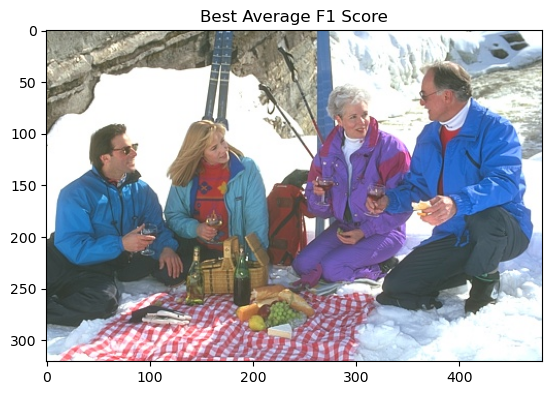

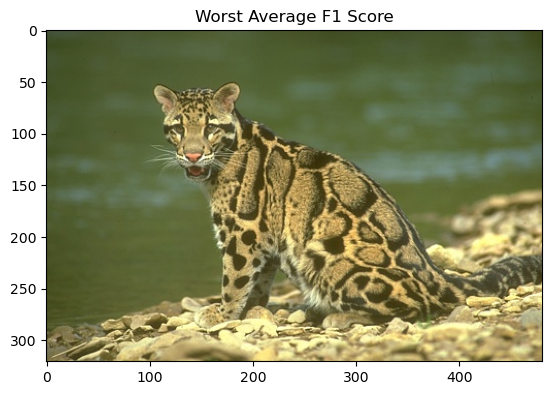

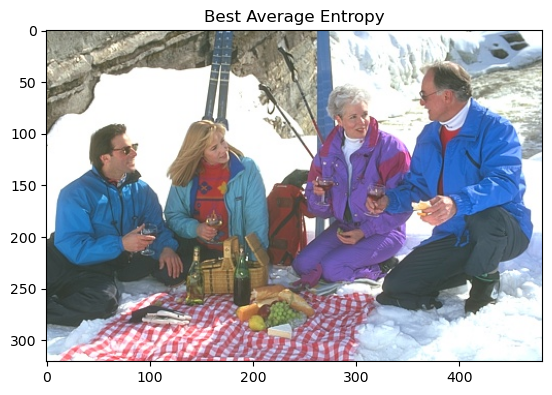

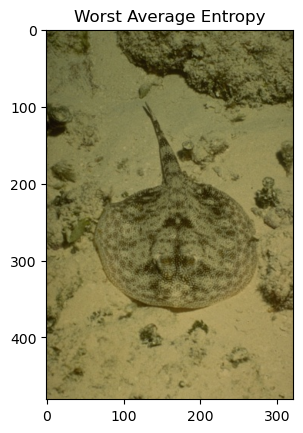

In [113]:
img1 = images[best_F]
if grounds[best_F][0].shape[0] != 321:
    img1 = cv2.rotate(img1, cv2.ROTATE_90_COUNTERCLOCKWISE)
img2 = images[worst_F]
if grounds[worst_F][0].shape[0] != 321:
    img2 = cv2.rotate(img2, cv2.ROTATE_90_COUNTERCLOCKWISE)
img3 = images[best_Ent]
if grounds[best_Ent][0].shape[0] != 321:
    img3 = cv2.rotate(img3, cv2.ROTATE_90_COUNTERCLOCKWISE)
img4 = images[worst_Ent]
if grounds[worst_Ent][0].shape[0] != 321:
    img4 = cv2.rotate(img4, cv2.ROTATE_90_COUNTERCLOCKWISE)
plt.figure()
plt.imshow(img1)
plt.title("Best Average F1 Score")
plt.figure()
plt.imshow(img2)
plt.title("Worst Average F1 Score")
plt.figure()
plt.imshow(img3)
plt.title("Best Average Entropy")
plt.figure()
plt.imshow(img4)
plt.title("Worst Average Entropy")

Text(0.5, 1.0, 'Worst Average Entropy')

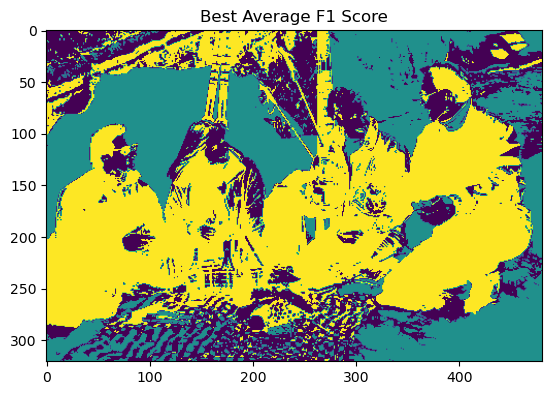

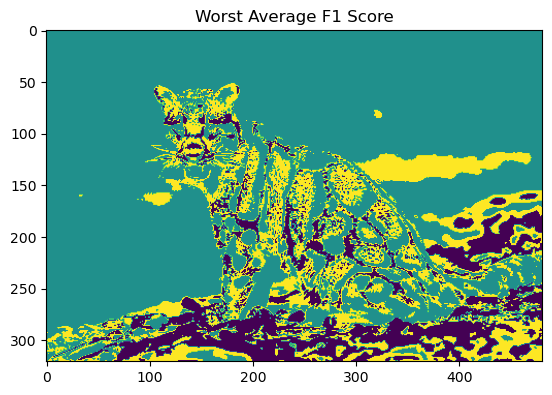

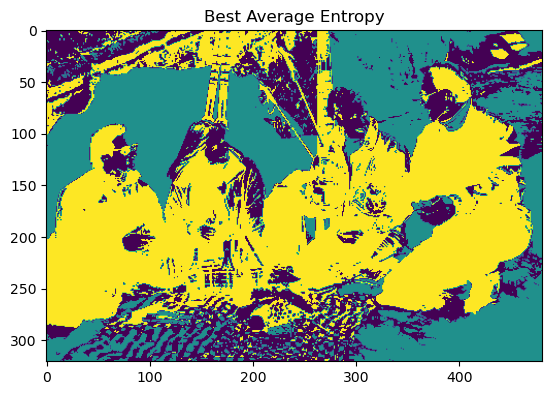

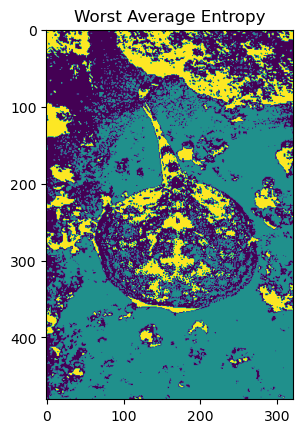

In [114]:
seg1 = clustered.get(3)[best_F].reshape(321,481)
if grounds[best_F][0].shape[0] != 321:
    seg1 = cv2.rotate(seg1, cv2.ROTATE_90_COUNTERCLOCKWISE)
seg2 = clustered.get(3)[worst_F].reshape(321,481)
if grounds[worst_F][0].shape[0] != 321:
    seg2 = cv2.rotate(seg2, cv2.ROTATE_90_COUNTERCLOCKWISE)
seg3 = clustered.get(3)[best_Ent].reshape(321,481)
if grounds[best_Ent][0].shape[0] != 321:
    seg3 = cv2.rotate(seg3, cv2.ROTATE_90_COUNTERCLOCKWISE)
seg4 = clustered.get(3)[worst_Ent].reshape(321,481)
if grounds[worst_Ent][0].shape[0] != 321:
    seg4 = cv2.rotate(seg4, cv2.ROTATE_90_COUNTERCLOCKWISE)
plt.figure()
plt.imshow(seg1)
plt.title("Best Average F1 Score")
plt.figure()
plt.imshow(seg2)
plt.title("Worst Average F1 Score")
plt.figure()
plt.imshow(seg3)
plt.title("Best Average Entropy")
plt.figure()
plt.imshow(seg4)
plt.title("Worst Average Entropy")

# Big Picture 

Showing 5 random images with their produced KMeans clustering at K = 5 as well as their original image and 2 of their ground truths.  




The given code is used to generate random images and their corresponding segmented, ground truth images, and plot them in a grid of 2x2 images. The image_rep function is responsible for generating the grid of images for a given index.

The code begins by defining the image_rep function. The function takes a single parameter, n, which represents the index of the image in the dataset.

The function starts by creating a figure with 2x2 subplots using the plt.subplots function. The subplots will be used to display the image, segmented image, and ground truth images.

Next, the function retrieves the image and corresponding segmented image for the given index n. The segmented image is obtained from the clustered object by calling its get method with the argument 5 (the K value) and indexing it with the index n. The segmented image is reshaped to have the same dimensions as the original image.

To ensure the correct orientation of the images, the code checks if the first image in the grounds list has a height of 321. If it doesn't, it means the images are rotated by 90 degrees and need to be rotated back. In this case, the original image and segmented image are rotated back using the cv2.rotate function with the cv2.ROTATE_90_COUNTERCLOCKWISE argument.

After ensuring the correct orientation, the function displays the image, segmented image, and ground truth images in the 2x2 grid of subplots using the imshow method.

The image_rep function is then used in a loop that generates a random index and calls the image_rep function with this index to generate and display the corresponding images. The loop repeats this process 5 times.

This code is used to generate a random sample of images from the dataset and visualize them along with their corresponding segmented images and ground truth images. This helps to understand the performance of the clustering algorithm on different images in the dataset.

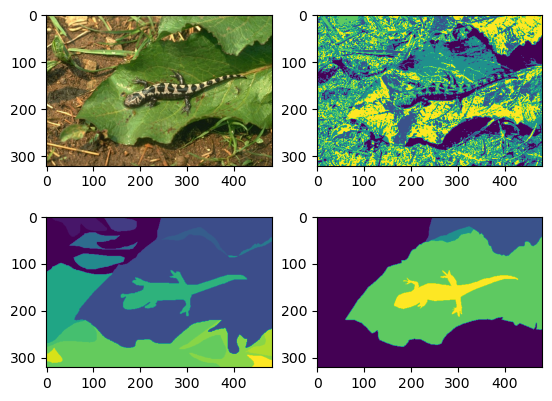

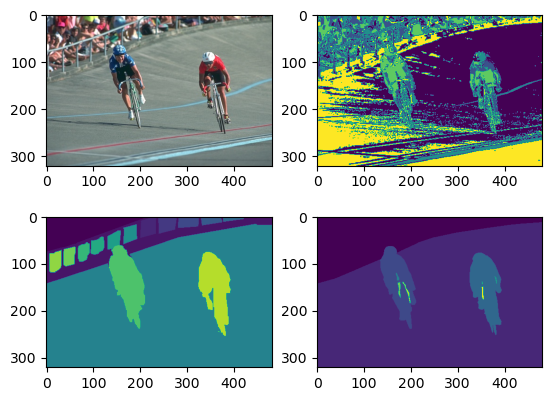

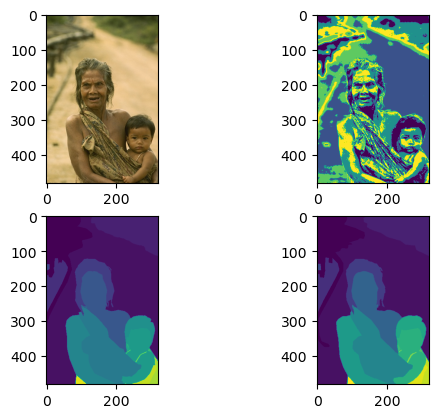

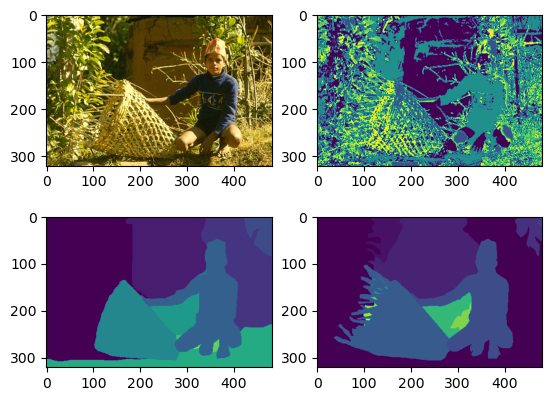

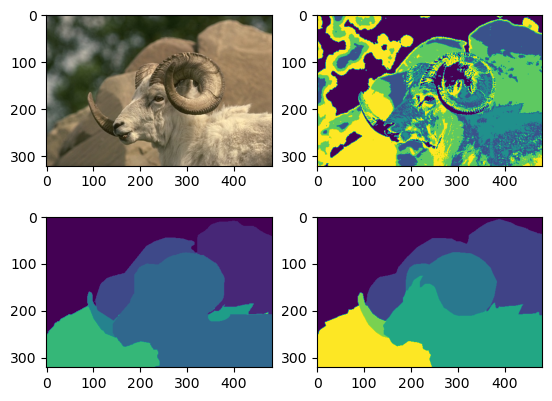

In [115]:
def image_rep(n):
    fig, axes = plt.subplots(2, 2)
    image = images[n]
    segmented = clustered.get(5)[n].reshape(321,481)
    if grounds[n][0].shape[0] != 321:
        image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
        segmented = cv2.rotate(segmented, cv2.ROTATE_90_COUNTERCLOCKWISE)
    axes[0, 0].imshow(image)
    axes[0, 1].imshow(segmented)
    axes[1, 0].imshow(grounds[n][0])
    axes[1, 1].imshow(grounds[n][1])
    plt.show()

indexes = []
for i in range(5):
    n = random.randint(0,50)
    indexes.append(n)
    image_rep(n)

Showing the same 5 images with their produced KNN classification at K = 5 as well as their original image and their KMeans clustered at K = 5.

E:\Anaconda\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
E:\Anaconda\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
E:\Anaconda\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
E:\Anaconda\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
E:\Anaconda\Lib\site-packages\sklearn\manifold\_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


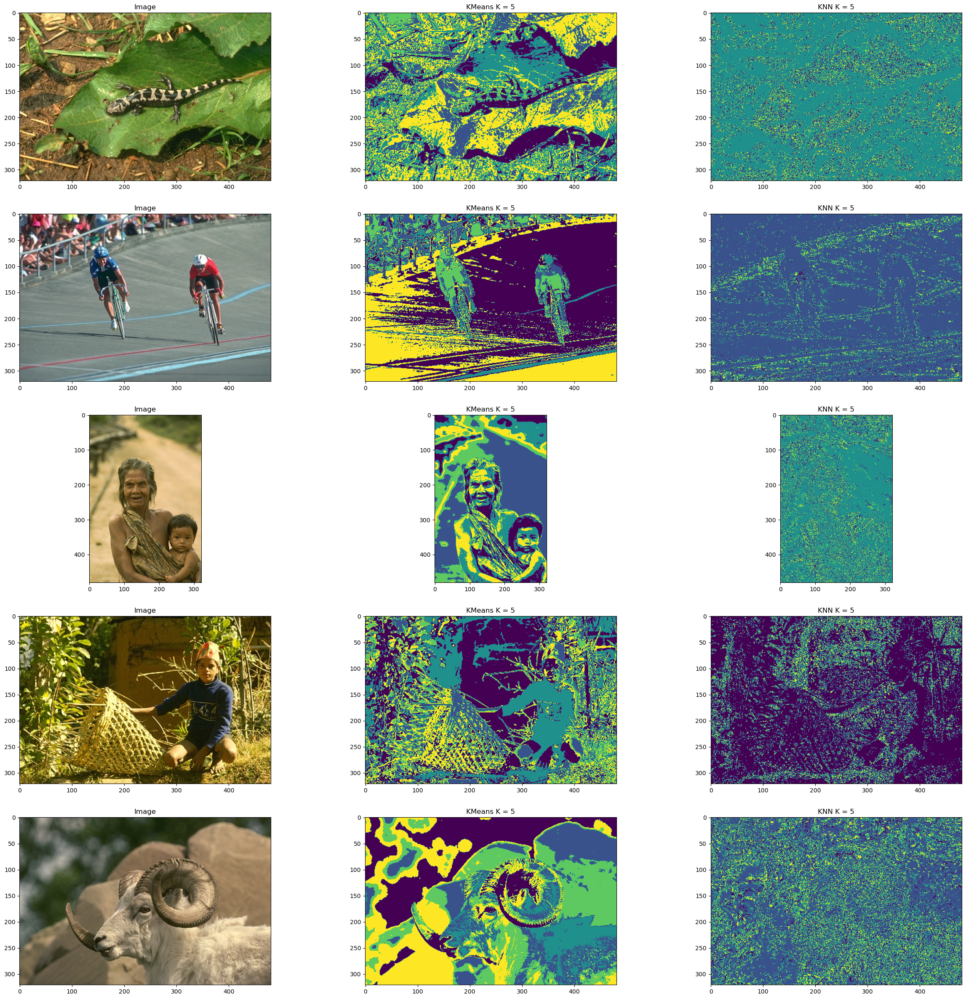

In [136]:
fig, axes = plt.subplots(5, 3)
plt.rcParams['figure.figsize'] = 30, 30
for i in range(5):
    seg = clustered.get(5)[indexes[i]].reshape(321,481)
    img = images[indexes[i]]
    X = np.reshape(img, (154401, -1))
    spectral = SpectralClustering(n_clusters=5, eigen_solver='amg', n_init=30, random_state=5, affinity='nearest_neighbors', n_neighbors=5, n_jobs=-1)
    segmented_image = spectral.fit_predict(X)
    segKNN = np.reshape(segmented_image, (321, 481))
    if grounds[indexes[i]][0].shape[0] != 321:
        segKNN = cv2.rotate(segKNN, cv2.ROTATE_90_COUNTERCLOCKWISE)
        seg = cv2.rotate(seg, cv2.ROTATE_90_COUNTERCLOCKWISE)
        img = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
    axes[i, 0].imshow(img)
    axes[i, 0].set_title("Image")
    axes[i, 1].imshow(seg)
    axes[i, 1].set_title("KMeans K = 5")
    axes[i, 2].imshow(segKNN)
    axes[i, 2].set_title("KNN K = 5")        
plt.show()